# CREDIT CARD FRAUD

In [246]:
# Initial imports
import numpy as np
import pandas as pd
import matplotlib as plt
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path 
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from imblearn.under_sampling import RandomUnderSampler
from sklearn.metrics import ConfusionMatrixDisplay

## Loading and Preprocessing Credit Card Fraud Encoded Data

In [247]:
# Load the CSV file
credit_card_fraud_csv = Path("Resources/fraud_data 4.csv")
credit_card_fraud_csv = pd.read_csv("Resources/fraud_data 4.csv")
credit_card_fraud_csv.head()

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud
0,04-01-2019 00:58,"""Stokes, Christiansen and Sipes""",grocery_net,14.37,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,a3806e984cec6ac0096d8184c64ad3a1,65.654142,-164.722603,1
1,04-01-2019 15:06,Predovic Inc,shopping_net,966.11,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,a59185fe1b9ccf21323f581d7477573f,65.468863,-165.473127,1
2,04-01-2019 22:37,Wisozk and Sons,misc_pos,49.61,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,86ba3a888b42cd3925881fa34177b4e0,65.347667,-165.914542,1
3,04-01-2019 23:06,Murray-Smitham,grocery_pos,295.26,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,3a068fe1d856f0ecedbed33e4b5f4496,64.445035,-166.080207,1
4,04-01-2019 23:59,Friesen Lt,health_fitness,18.17,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,891cdd1191028759dc20dc224347a0ff,65.447094,-165.446843,1


In [248]:
# Show Dataset Structure
credit_card_fraud_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14446 entries, 0 to 14445
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   trans_date_trans_time  14446 non-null  object 
 1   merchant               14446 non-null  object 
 2   category               14446 non-null  object 
 3   amt                    14446 non-null  float64
 4   city                   14446 non-null  object 
 5   state                  14446 non-null  object 
 6   lat                    14446 non-null  float64
 7   long                   14446 non-null  float64
 8   city_pop               14446 non-null  int64  
 9   job                    14446 non-null  object 
 10  dob                    14446 non-null  object 
 11  trans_num              14446 non-null  object 
 12  merch_lat              14446 non-null  float64
 13  merch_long             14446 non-null  float64
 14  is_fraud               14446 non-null  object 
dtypes:

In [249]:
#check for missing values
credit_card_fraud_csv.isnull().sum()

trans_date_trans_time    0
merchant                 0
category                 0
amt                      0
city                     0
state                    0
lat                      0
long                     0
city_pop                 0
job                      0
dob                      0
trans_num                0
merch_lat                0
merch_long               0
is_fraud                 0
dtype: int64

In [250]:
# get the uniques values for each columns
credit_card_fraud_csv['is_fraud'].unique()

array(['1', '1"2020-12-24 16:56:24"', '0', '0"2019-01-01 00:00:44"'],
      dtype=object)

In [251]:
# Summary Statistics
credit_card_fraud_csv.describe()

,amt,lat,long,city_pop,merch_lat,merch_long
count,14446.000000,14446.000000,14446.000000,1.444600e+04,14446.000000,14446.000000
mean,124.430073,39.787692,-110.874225,1.065370e+05,39.787991,-110.874892
std,231.352587,5.317039,12.985813,2.902916e+05,5.360593,12.995596
min,1.000000,20.027100,-165.672300,4.600000e+01,19.032689,-166.670685
25%,12.080000,36.715400,-120.415800,4.930000e+02,36.794655,-120.146253
50%,51.520000,39.666200,-111.098500,1.645000e+03,39.620953,-111.192629
75%,101.030000,41.940400,-101.136000,3.543900e+04,42.275740,-100.446822
max,3261.470000,66.693300,-89.628700,2.383912e+06,67.510267,-88.646366


In [252]:
#Convert 'trans_date_trans_time' to datetime
credit_card_fraud_csv['trans_date_trans_time'] = pd.to_datetime(credit_card_fraud_csv['trans_date_trans_time'], dayfirst=True, errors='coerce')
credit_card_fraud_csv

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,is_fraud
0,2019-01-04 00:58:00,"""Stokes, Christiansen and Sipes""",grocery_net,14.37,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,a3806e984cec6ac0096d8184c64ad3a1,65.654142,-164.722603,1
1,2019-01-04 15:06:00,Predovic Inc,shopping_net,966.11,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,a59185fe1b9ccf21323f581d7477573f,65.468863,-165.473127,1
2,2019-01-04 22:37:00,Wisozk and Sons,misc_pos,49.61,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,86ba3a888b42cd3925881fa34177b4e0,65.347667,-165.914542,1
3,2019-01-04 23:06:00,Murray-Smitham,grocery_pos,295.26,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,3a068fe1d856f0ecedbed33e4b5f4496,64.445035,-166.080207,1
4,2019-01-04 23:59:00,Friesen Lt,health_fitness,18.17,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,891cdd1191028759dc20dc224347a0ff,65.447094,-165.446843,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14441,2019-01-22 00:37:00,Hudson-Grady,shopping_pos,122.00,Athena,OR,45.8289,-118.4971,1302,Dealer,18-10-1976,699a4c06b22711bf3e0d8ef91232d356,46.442439,-118.524214,0
14442,2019-01-22 00:41:00,"""Nienow, Ankunding and Collie""",misc_pos,9.07,Gardiner,OR,43.7857,-124.1437,260,"""Engineer, maintenance""",01-09-1956,080d620d24815c7d6c637cf0b71dde8e,42.901265,-124.995317,0
14443,2019-01-22 00:42:00,Pacocha-O'Reilly,grocery_pos,104.84,Alva,WY,44.6873,-104.4414,110,"""Administrator, local government""",16-05-1973,3c346c8cd627c5fe3ed57430db2e9ae7,45.538062,-104.542117,0
14444,2019-01-22 00:48:00,"""Bins, Balistreri and Beatty""",shopping_pos,268.16,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,e66ffcc95ba7fc490486242af1205d04,64.081462,-165.898698,0


In [253]:
# check for duplicates
credit_card_fraud_csv.duplicated()


0        False
1        False
2        False
3        False
4        False
         ...  
14441    False
14442    False
14443    False
14444    False
14445    False
Length: 14446, dtype: bool

In [254]:
# check the 'is_fraud' columns
print(credit_card_fraud_csv['is_fraud'].value_counts())

is_fraud
0                         12600
1                          1844
1"2020-12-24 16:56:24"        1
0"2019-01-01 00:00:44"        1
Name: count, dtype: int64


In [255]:
# Remove content inside the quotes and keep only 1 or 0
credit_card_fraud_csv['is_fraud'] = credit_card_fraud_csv['is_fraud'].str.extract(r'([01])').astype(int)

# Verify the cleaning
print(credit_card_fraud_csv['is_fraud'].value_counts())

is_fraud
0    12601
1     1845
Name: count, dtype: int64


# DATA Visualization

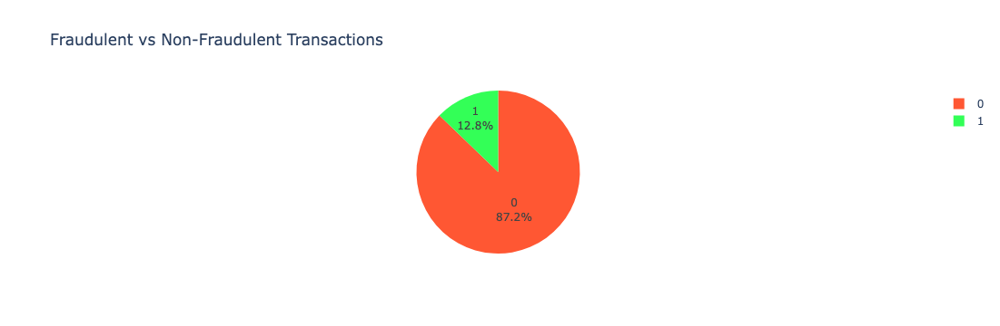

In [256]:

# Define custom colors for fraud and non-fraud
custom_colors = ['#FF5733', '#33FF57']  

# Create a pie chart for Fraud vs Non-Fraud transactions with custom colors
fig = px.pie(
    credit_card_fraud_csv,
    names='is_fraud',  # Column that contains fraud status (1 for fraud, 0 for non-fraud)
    title='Fraudulent vs Non-Fraudulent Transactions',
    color_discrete_sequence=custom_colors) 

# Customize the layout
fig.update_traces(textposition='inside', textinfo='percent+label')

# Show the pie chart
fig.show()

In [257]:

# Extract the month from the transaction date
credit_card_fraud_csv['month'] = credit_card_fraud_csv['trans_date_trans_time'].dt.month

# Group by month and filter for fraudulent transactions (is_fraud == 1)
fraud_by_month = credit_card_fraud_csv[credit_card_fraud_csv['is_fraud'] == 1].groupby('month').size().reset_index(name='fraud_count')

# Find the month with the highest number of fraudulent transactions
highest_fraud_month = fraud_by_month.loc[fraud_by_month['fraud_count'].idxmax()]

# Display the result
print(f"The month with the highest number of fraudulent transactions is: {highest_fraud_month['month']} with {highest_fraud_month['fraud_count']} fraudulent transactions.")

The month with the highest number of fraudulent transactions is: 3 with 220 fraudulent transactions.


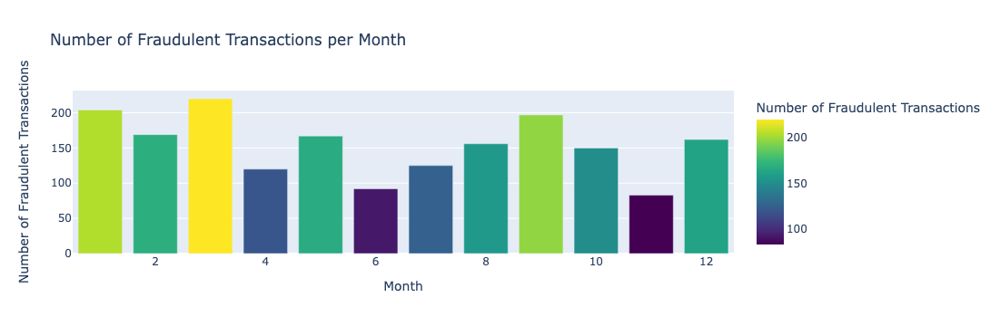

In [258]:
# Group by month and count the number of fraudulent transactions (is_fraud == 1)
fraud_by_month = credit_card_fraud_csv[credit_card_fraud_csv['is_fraud'] == 1].groupby('month').size().reset_index(name='fraud_count')

# Create a bar chart to visualize the number of fraudulent transactions per month
fig = px.bar(
    fraud_by_month,
    x='month',
    y='fraud_count',
    title='Number of Fraudulent Transactions per Month',
    labels={'month': 'Month', 'fraud_count': 'Number of Fraudulent Transactions'},
    color='fraud_count',
    color_continuous_scale='Viridis'  # Optional color scale
)

# Show the plot
fig.show()

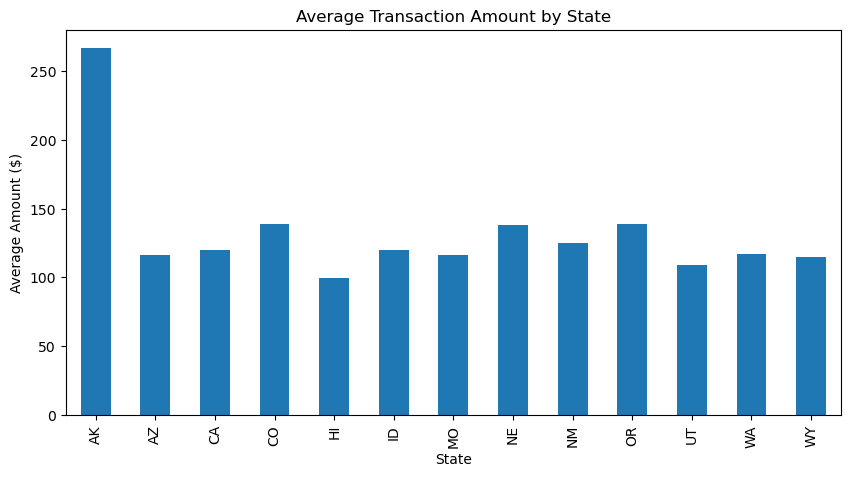

In [259]:
#Amount by state
state_avg = credit_card_fraud_csv.groupby('state')['amt'].mean()
state_avg.plot(kind='bar', figsize=(10, 5))
plt.title('Average Transaction Amount by State')
plt.xlabel('State')
plt.ylabel('Average Amount ($)')
plt.show()

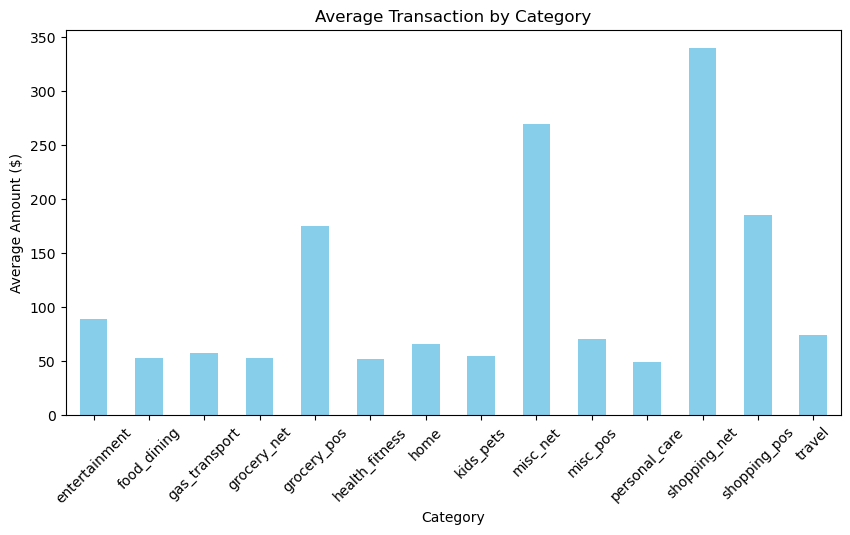

In [260]:
# Category by Amount
category_avg = credit_card_fraud_csv.groupby('category')['amt'].mean()
category_avg.plot(kind='bar', figsize=(10, 5), color='skyblue') 
plt.title('Average Transaction by Category')
plt.xlabel('Category')
plt.ylabel('Average Amount ($)')
plt.xticks(rotation=45)
plt.show()



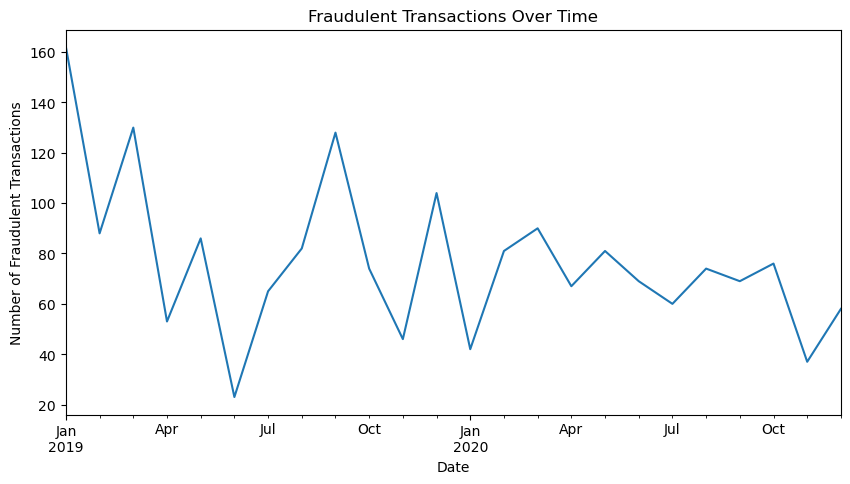

In [261]:
# Fraud Transactions Over Time
fraud_transaction = credit_card_fraud_csv[credit_card_fraud_csv['is_fraud'] ==1].set_index('trans_date_trans_time').resample('M').size()
fraud_transaction.plot(kind='line', figsize=(10, 5))
plt.title('Fraudulent Transactions Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Fraudulent Transactions')
plt.show()

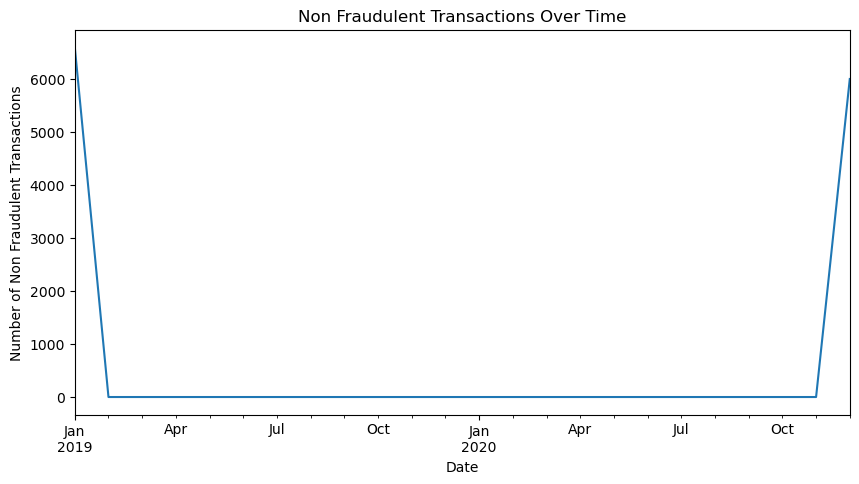

In [262]:
#  Non Fraudulent Transactions Over Time
Non_fraud_transaction = credit_card_fraud_csv[credit_card_fraud_csv['is_fraud'] ==0].set_index('trans_date_trans_time').resample('M').size()
Non_fraud_transaction.plot(kind='line', figsize=(10, 5))
plt.title('Non Fraudulent Transactions Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Non Fraudulent Transactions')
plt.show()

/opt/anaconda3/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



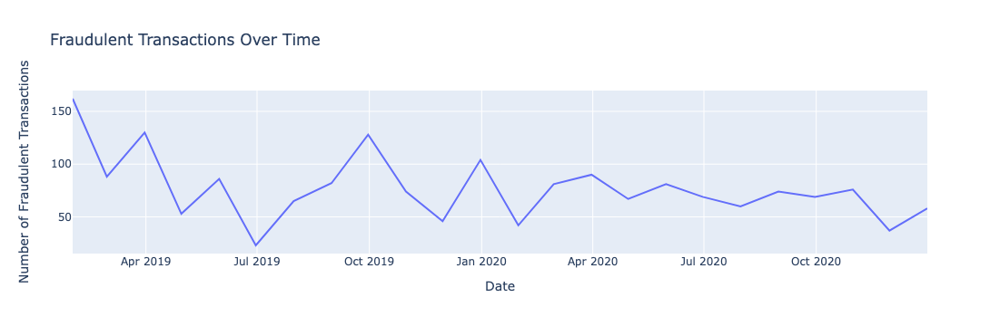

In [263]:
# Create a function to generate time series plots
def create_time_series_plot(data, title, y_label):
    fig = px.line(data, x=data.index, y=data.values,
                title=title,
                labels={'x': 'Date', 'y': y_label})
    fig.update_layout(showlegend=False, xaxis_title='Date', yaxis_title=y_label)
    return fig

# Fraud Transactions Over Time
fraud_transaction = credit_card_fraud_csv[credit_card_fraud_csv['is_fraud'] == 1].set_index('trans_date_trans_time').resample('M').size()
fig1 = create_time_series_plot(fraud_transaction, 'Fraudulent Transactions Over Time', 'Number of Fraudulent Transactions')
fig1.show()


/opt/anaconda3/lib/python3.11/site-packages/_plotly_utils/basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



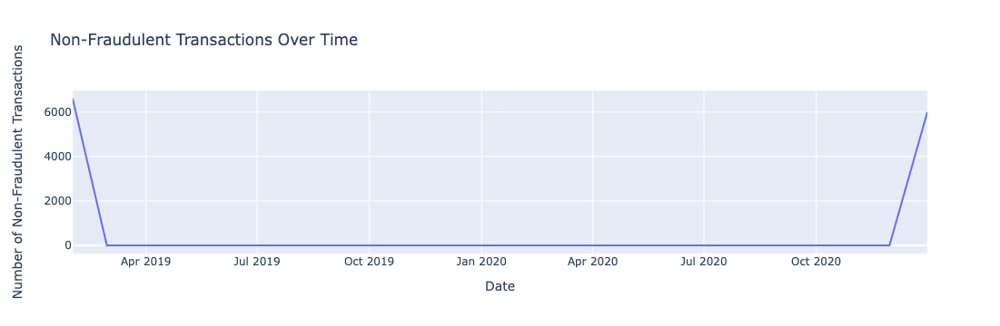

In [264]:
# Non-Fraudulent Transactions Over Time
non_fraud_transaction = credit_card_fraud_csv[credit_card_fraud_csv['is_fraud'] == 0].set_index('trans_date_trans_time').resample('M').size()
fig2 = create_time_series_plot(non_fraud_transaction, 'Non-Fraudulent Transactions Over Time', 'Number of Non-Fraudulent Transactions')
# Transactions by Category
def create_category_plot(data, title, y_label):
    df = pd.DataFrame({'category': data.index, 'Values': data.values})  # Convert index and values to DataFrame
    fig = px.bar(df, x='category', y='Values',
                 title=title,
                 labels={'Values': y_label, 'category': 'category'})
    fig.update_layout(xaxis_tickangle=-45)
    return fig
transactions_by_category= credit_card_fraud_csv.groupby('category').size()
fig2.show()
    


In [265]:
# Filter fraudulent transactions
fraud_transaction = credit_card_fraud_csv[credit_card_fraud_csv['is_fraud'] == 1]
# Group by transaction type and count occurrences
fraud_counts = fraud_transaction['category'].value_counts()


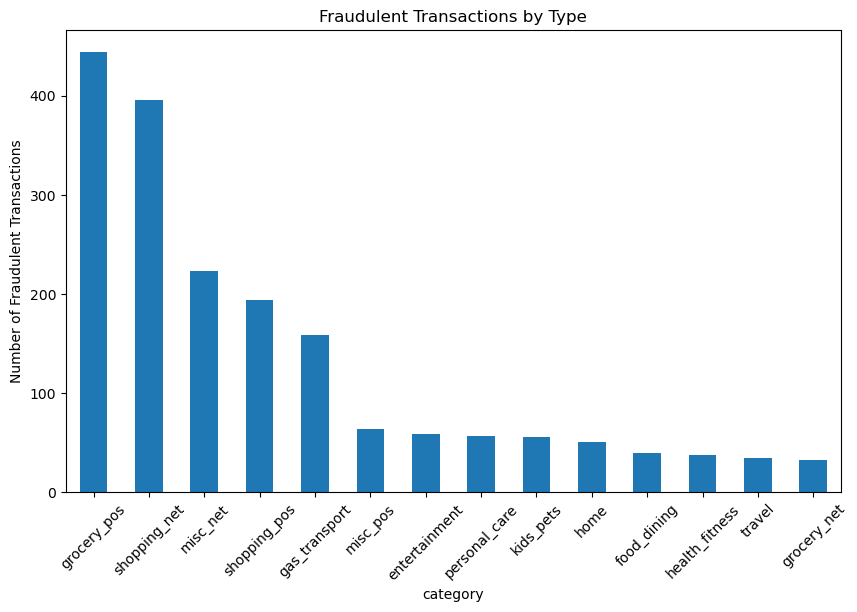

In [266]:
# Create a bar plot
plt.figure(figsize=(10, 6))
fraud_counts.plot(kind='bar')
plt.title('Fraudulent Transactions by Type')
plt.xlabel('category')
plt.ylabel('Number of Fraudulent Transactions')
plt.xticks(rotation=45)
plt.show()

In [267]:
# Filter fraudulent transactions
fraud_transaction = credit_card_fraud_csv[credit_card_fraud_csv['is_fraud'] == 0]
# Group by transaction type and count occurrences
fraud_counts = fraud_transaction['category'].value_counts()

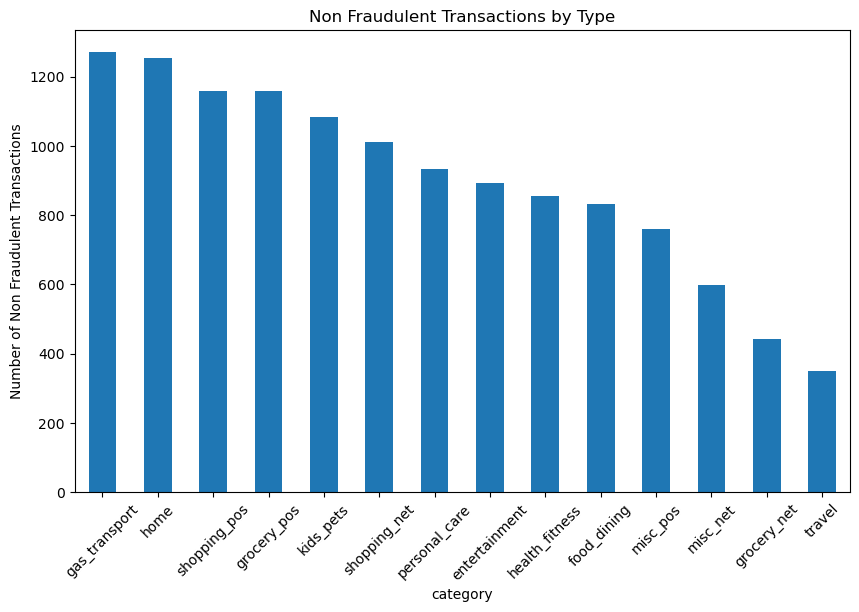

In [268]:
# Create a bar plot
plt.figure(figsize=(10, 6))
fraud_counts.plot(kind='bar')
plt.title('Non Fraudulent Transactions by Type')
plt.xlabel('category')
plt.ylabel('Number of Non Fraudulent Transactions')
plt.xticks(rotation=45)
plt.show()

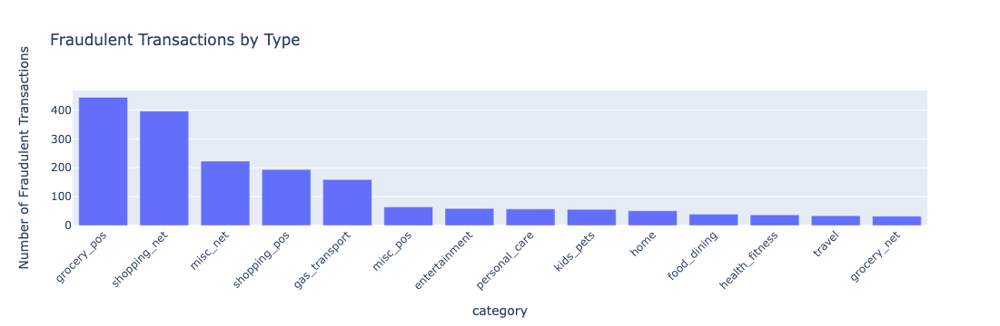

In [269]:
# Fraudulent Transactions by Type
fraud_counts = credit_card_fraud_csv[credit_card_fraud_csv['is_fraud'] == 1]['category'].value_counts()
fig3 = create_category_plot(fraud_counts, 'Fraudulent Transactions by Type', 'Number of Fraudulent Transactions')

# Show the plot
fig3.show()

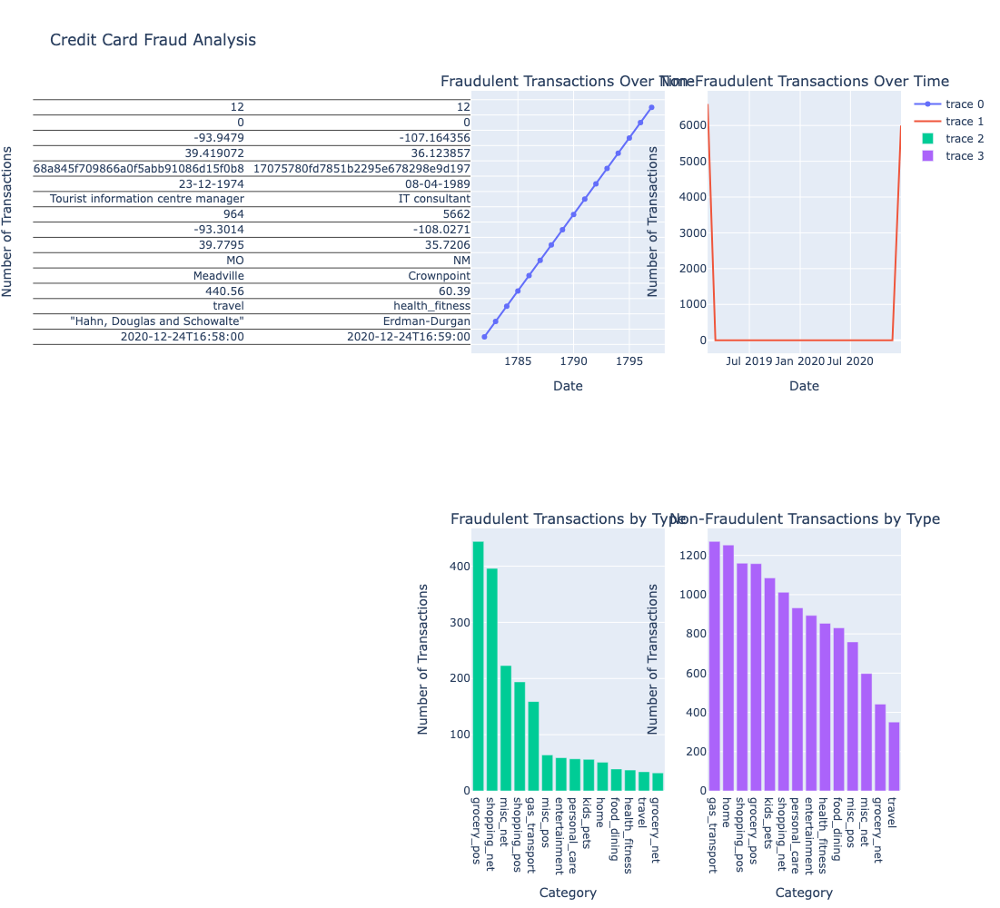

In [270]:
# Non-Fraudulent Transactions by Type
non_fraud_counts = credit_card_fraud_csv[credit_card_fraud_csv['is_fraud'] == 0]['category'].value_counts()
fig4 = create_category_plot(non_fraud_counts, 'Non-Fraudulent Transactions by Type', 'Number of Non-Fraudulent Transactions')

# Create a subplot with all charts
fig = make_subplots(rows=2, cols=2, subplot_titles=("Fraudulent Transactions Over Time", 
                                                    "Non-Fraudulent Transactions Over Time",
                                                    "Fraudulent Transactions by Type", 
                                                    "Non-Fraudulent Transactions by Type"))

# Add traces
fig.add_trace(go.Scatter(x=fraud_transaction.index, y=fraud_transaction.values), row=1, col=1)
fig.add_trace(go.Scatter(x=non_fraud_transaction.index, y=non_fraud_transaction.values), row=1, col=2)
fig.add_trace(go.Bar(x=fraud_counts.index, y=fraud_counts.values), row=2, col=1)
fig.add_trace(go.Bar(x=non_fraud_counts.index, y=non_fraud_counts.values), row=2, col=2)


# Update layout
fig.update_layout(height=1000, width=1200, title_text="Credit Card Fraud Analysis")
fig.update_xaxes(title_text="Date", row=1, col=1)
fig.update_xaxes(title_text="Date", row=1, col=2)
fig.update_xaxes(title_text="Category", row=2, col=1)
fig.update_xaxes(title_text="Category", row=2, col=2)
fig.update_yaxes(title_text="Number of Transactions", row=1, col=1)
fig.update_yaxes(title_text="Number of Transactions", row=1, col=2)
fig.update_yaxes(title_text="Number of Transactions", row=2, col=1)
fig.update_yaxes(title_text="Number of Transactions", row=2, col=2)

# Show the plot
fig.show()




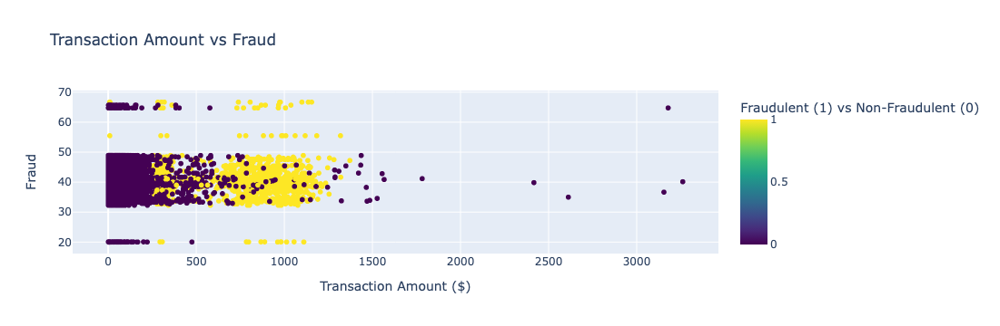

In [271]:
# Create a scatter plot
fig = px.scatter(
    credit_card_fraud_csv,
    x='amt',
    y='lat',  # You can change this to another variable if needed
    color='is_fraud',  # Color by fraud status
    color_continuous_scale='Viridis',  # Use a valid Plotly colorscale
    title='Transaction Amount vs Latitude',
    labels={'amt': 'Transaction Amount ($)', 'lat': 'Latitude', 'is_fraud': 'Fraudulent'},
    hover_data={'amt': True, 'lat': True, 'is_fraud': True}  # Display more details on hover
)
# Update layout
fig.update_layout(
    title='Transaction Amount vs Fraud',
    xaxis_title='Transaction Amount ($)',
    yaxis_title='Fraud',
    coloraxis_colorbar=dict(
        title='Fraudulent (1) vs Non-Fraudulent (0)'
    )
)
# Show the plot
fig.show()





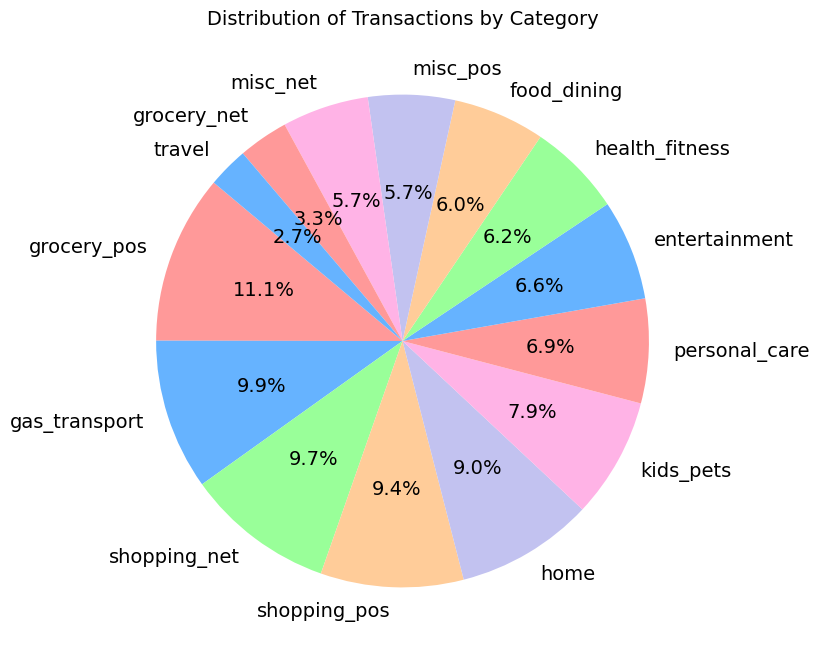

In [272]:
# Count the number of transactions per category
category_counts = credit_card_fraud_csv['category'].value_counts()
# Define custom colors
custom_colors = ['#FF9999','#66B3FF','#99FF99','#FFCC99','#C2C2F0','#FFB3E6']  # Customize as needed
# Create a pie chart
fig, ax = plt.subplots(figsize=(10, 8))
ax.pie(
    category_counts,
    labels=category_counts.index,
    autopct='%1.1f%%',
    colors=custom_colors,
    startangle=140,
    textprops={'fontsize': 14}
)
# Add a title
ax.set_title('Distribution of Transactions by Category', fontsize=14)
# Show the pie chart
plt.show()

# DATA PREDICTION

#### Define the features set, by copying the credit_card_fraud_csv DataFrame and dropping the is_fraud column.

In [273]:
# Define features set
X = credit_card_fraud_csv.copy()
X.drop('is_fraud', axis=1, inplace=True)
X.head()

,trans_date_trans_time,merchant,category,amt,city,state,lat,long,city_pop,job,dob,trans_num,merch_lat,merch_long,month
0,2019-01-04 00:58:00,"""Stokes, Christiansen and Sipes""",grocery_net,14.37,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,a3806e984cec6ac0096d8184c64ad3a1,65.654142,-164.722603,1
1,2019-01-04 15:06:00,Predovic Inc,shopping_net,966.11,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,a59185fe1b9ccf21323f581d7477573f,65.468863,-165.473127,1
2,2019-01-04 22:37:00,Wisozk and Sons,misc_pos,49.61,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,86ba3a888b42cd3925881fa34177b4e0,65.347667,-165.914542,1
3,2019-01-04 23:06:00,Murray-Smitham,grocery_pos,295.26,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,3a068fe1d856f0ecedbed33e4b5f4496,64.445035,-166.080207,1
4,2019-01-04 23:59:00,Friesen Lt,health_fitness,18.17,Wales,AK,64.7556,-165.6723,145,"""Administrator, education""",09-11-1939,891cdd1191028759dc20dc224347a0ff,65.447094,-165.446843,1


In [274]:
# Drop non-numeric columns
X = credit_card_fraud_csv.drop(['is_fraud', 'trans_date_trans_time', 'merchant', 'category', 'city', 'state', 'job', 'dob', 'trans_num'], axis=1)
# Check if all remaining features are numeric
print(X.dtypes)


amt           float64
lat           float64
long          float64
city_pop        int64
merch_lat     float64
merch_long    float64
month           int32
dtype: object


In [275]:
# Define the target variable
y = credit_card_fraud_csv['is_fraud']
y

0        1
1        1
2        1
3        1
4        1
        ..
14441    0
14442    0
14443    0
14444    0
14445    0
Name: is_fraud, Length: 14446, dtype: int64

#### Split the data into training and testing sets.

In [276]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

###### Use the `StandardScaler` to scale the features data, remember that only `X_train` and `X_testing` DataFrames should be scaled.

In [277]:
# Create the StandardScaler instance
scaler = StandardScaler()

In [278]:
# Train the Random Forest classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

# Balancing Data to improve recall

#### Option 1: Class Weight

In [279]:
 #Train the model with class_weight 
model = RandomForestClassifier(class_weight='balanced' , random_state=42)
model.fit(X_train, y_train)
# Predict on the test set
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3769
           1       0.97      0.96      0.96       565

    accuracy                           0.99      4334
   macro avg       0.98      0.98      0.98      4334
weighted avg       0.99      0.99      0.99      4334



In [280]:
# Make predictions and evaluate the model
y_pred = rf_model.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print(classification_report(y_test, y_pred))

Accuracy: 0.9900784494693124
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3769
           1       0.97      0.96      0.96       565

    accuracy                           0.99      4334
   macro avg       0.98      0.98      0.98      4334
weighted avg       0.99      0.99      0.99      4334



#### OPTION 2 Random Undersampling

In [281]:
# Initialize the undersampler
rus = RandomUnderSampler(random_state=42)

# Apply undersampling to balance the classes
X_resampled, y_resampled = rus.fit_resample(X_train, y_train)




In [282]:
y_pred_proba = model.predict_proba(X_test.values)[:, 1]  # Probabilities for class 1 (fraud)

# Adjust the threshold (e.g., 0.65 or 0.5)
threshold = 0.75
y_pred_adjusted = (y_pred_proba >= threshold).astype(int)


/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



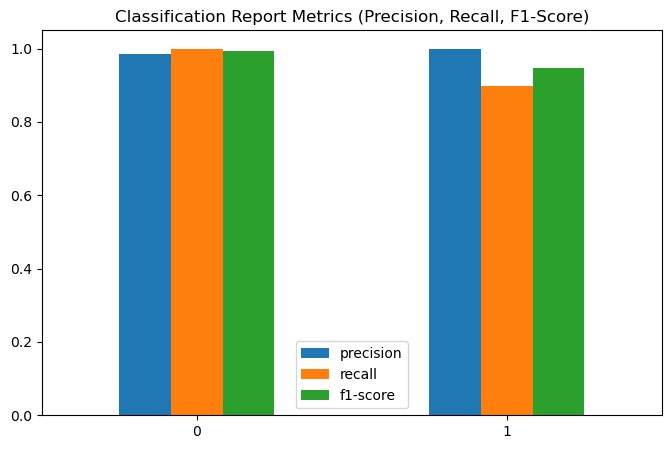

In [283]:
# Generate classification report
report = classification_report(y_test, y_pred_adjusted, output_dict=True)
# Convert the report to a DataFrame for easier plotting
report_df = pd.DataFrame(report).transpose()
# Plot precision, recall, and f1-score for each class
report_df[['precision', 'recall', 'f1-score']].iloc[:2].plot(kind='bar', figsize=(8, 5))
plt.title('Classification Report Metrics (Precision, Recall, F1-Score)')
plt.xticks(rotation=0)
plt.show()

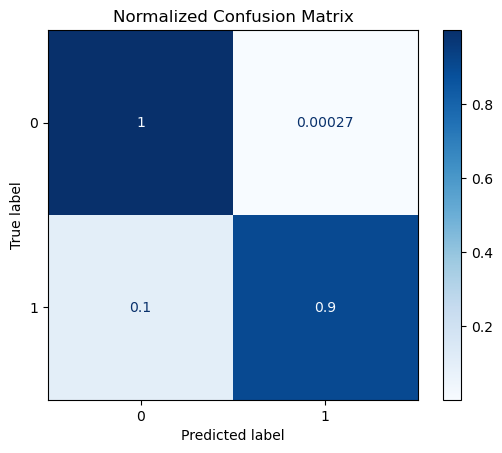

In [284]:
# Display normalized confusion matrix
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_adjusted, normalize='true', cmap='Blues')
plt.title('Normalized Confusion Matrix')
plt.show()

In [285]:
# Calculate confusion matrix
cm = confusion_matrix(y_test, y_pred)
cm_df = pd.DataFrame(
    cm, index=["Actual 0", "Actual 1"], columns=["Predicted 0", "Predicted 1"]
)
cm_df

,Predicted 0,Predicted 1
Actual 0,3750,19
Actual 1,24,541


In [286]:
# Fit and transform on training data, then transform test data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [287]:
# Train the model with the scaled training data
model.fit(X_train_scaled, y_train)

RandomForestClassifier(class_weight='balanced', random_state=42)

In [288]:
# Making predictions using the testing data
predictions = rf_model.predict(X_test_scaled)

/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



In [289]:
print("Class distribution in y_test:\n", y_test.value_counts())

Class distribution in y_test:
 is_fraud
0    3769
1     565
Name: count, dtype: int64


In [290]:
# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred_adjusted)

# Convert the confusion matrix to a DataFrame for easier display in heatmap
cm_df = pd.DataFrame(cm, index=["Actual 0", "Actual 1"], columns=["Predicted 0", "Predicted 1"])



# Display classification report
print("Classification report:")
print(classification_report(y_test, y_pred_adjusted))


Classification report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3769
           1       1.00      0.90      0.95       565

    accuracy                           0.99      4334
   macro avg       0.99      0.95      0.97      4334
weighted avg       0.99      0.99      0.99      4334



In [291]:
# Train the model with class_weight 
model = RandomForestClassifier(class_weight='balanced' , random_state=42)
model.fit(X_train, y_train)
# Predict on the test set
y_pred = model.predict(X_test)
print(classification_report(y_test, y_pred))


              precision    recall  f1-score   support

           0       0.99      1.00      0.99      3769
           1       0.97      0.96      0.96       565

    accuracy                           0.99      4334
   macro avg       0.98      0.98      0.98      4334
weighted avg       0.99      0.99      0.99      4334



In [292]:
# Make predictions and evaluate the model
y_pred = rf_model.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print(classification_report(y_test, y_pred))

Accuracy: 0.9900784494693124
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      3769
           1       0.97      0.96      0.96       565

    accuracy                           0.99      4334
   macro avg       0.98      0.98      0.98      4334
weighted avg       0.99      0.99      0.99      4334



In [293]:
# Convert 'trans_date_trans_time' to datetime and extract hour and day of week
credit_card_fraud_csv['day_of_week'] = credit_card_fraud_csv['trans_date_trans_time'].dt.day_name()
# Group by day of week to find fraud trends
fraud_by_day = credit_card_fraud_csv[credit_card_fraud_csv['is_fraud'] == 1].groupby('day_of_week').size()
fraud_by_day

day_of_week
Friday       277
Monday       340
Saturday     313
Sunday       285
Thursday     203
Tuesday      229
Wednesday    198
dtype: int64

# More Visualization

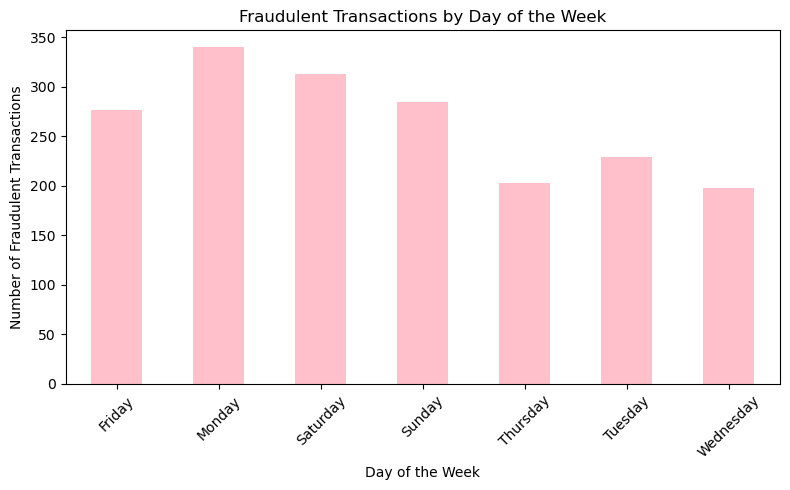

In [294]:
# Plotting fraud by day of the week
plt.figure(figsize=(8, 5))
fraud_by_day.sort_index().plot(kind='bar', color='pink')
plt.title('Fraudulent Transactions by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Fraudulent Transactions')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

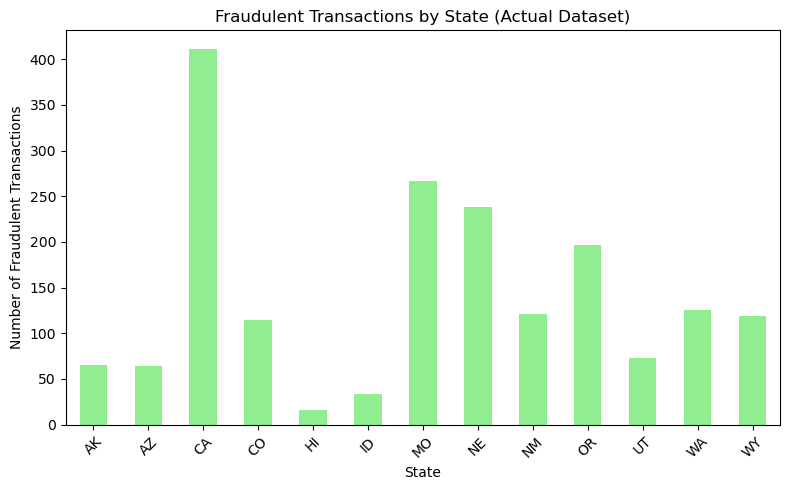

In [295]:
# Group by 'state' to find fraud trends by state
fraud_by_state_real = credit_card_fraud_csv[credit_card_fraud_csv['is_fraud'] == 1].groupby('state').size()

# Plotting fraud by state using the actual dataset
plt.figure(figsize=(8, 5))
fraud_by_state_real.sort_index().plot(kind='bar', color='lightgreen')
plt.title('Fraudulent Transactions by State (Actual Dataset)')
plt.xlabel('State')
plt.ylabel('Number of Fraudulent Transactions')
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()